In [10]:
import numpy as np
import trimesh
import matplotlib.pyplot as plt
from PIL import Image
from rlr_audio_propagation import Config, Context, ChannelLayout, ChannelLayoutType

Image.MAX_IMAGE_PIXELS = None
glb_file = "/datasets/soundspaces/scene_datasets/gibson_data/gibson/Oyens.glb"
mesh = trimesh.load(glb_file, force='mesh')

# MESH REPAIR PROCESS 
vertices = mesh.vertices.copy()
faces = mesh.faces.copy()
new_mesh = trimesh.Trimesh(vertices=vertices, faces=faces)
broken_faces = trimesh.repair.broken_faces(new_mesh)
print(f"Number of broken faces: {len(broken_faces)}")
trimesh.repair.fix_inversion(new_mesh)
trimesh.repair.fix_normals(new_mesh)
trimesh.repair.fix_winding(new_mesh)
new_mesh.fill_holes()
new_mesh.visual.face_colors = np.ones((len(new_mesh.faces), 4)) * 255
new_mesh.visual.face_colors[broken_faces] = [255, 0, 0, 255]
broken_faces = trimesh.repair.broken_faces(new_mesh)
print(f"Number of broken faces: {len(broken_faces)}")

scene = trimesh.Scene()
scene.add_geometry(new_mesh)

cfg = Config()
# cfg.indirect_ray_count = 50000 
# cfg.indirect_ray_depth = 25  
# cfg.source_ray_count = 50000 
# cfg.source_ray_depth = 25 
# cfg.max_diffraction_order = 1
# cfg.direct_ray_count = 8000 
# cfg.max_ir_length = 1.5 
# cfg.mesh_simplification = False

source_spheres = []

def add_sphere(scene, pos, color=[0,0,0], r=0.2):
    sphere = trimesh.creation.uv_sphere(radius=r)
    sphere.apply_translation(pos)
    sphere.visual.face_colors = color
    scene.add_geometry(sphere)
    return sphere

def is_point_inside_mesh(mesh, point):
    return mesh.contains([point])[0]

def get_random_point_inside_mesh(mesh, min_distance_from_surface=0.2):
    while True:
        point = np.random.uniform(mesh.bounds[0], mesh.bounds[1])
        if is_point_inside_mesh(mesh, point):
            # Check distance from surface
            _, distance, _ = mesh.nearest.on_surface([point])
            if distance[0] >= min_distance_from_surface:
                return point

def calculate_weighted_average_ray_length(mesh, point, num_rays=100):
    angles = np.random.uniform(0, 2*np.pi, num_rays)
    elevations = np.random.uniform(-np.pi/2, np.pi/2, num_rays)
    directions = np.column_stack([
        np.cos(elevations) * np.cos(angles),
        np.cos(elevations) * np.sin(angles),
        np.sin(elevations)
    ])
    origins = np.tile(point, (num_rays, 1))
    distances = trimesh.proximity.longest_ray(mesh, origins, directions)
    
    # Apply weights to the distances (square the distances)
    weights = distances ** 2
    
    # Calculate weighted average
    weighted_average = np.sum(distances * weights) / np.sum(weights)
    
    return weighted_average

# Find a suitable microphone position
min_avg_ray_length = 3.0  # we can adjust this value as needed 
max_attempts = 100
for attempt in range(max_attempts):
    mic_pos = get_random_point_inside_mesh(new_mesh)
    avg_ray_length = calculate_weighted_average_ray_length(new_mesh, mic_pos)
    
    if avg_ray_length >= min_avg_ray_length:
        print(f"Found suitable microphone position after {attempt+1} attempts")
        break
else:
    print(f"Could not find a suitable position after {max_attempts} attempts. Using the last attempted position.")

add_sphere(scene, mic_pos, [255, 0, 0]) # MICROPHONE IS PLACED! 

ctx = Context(cfg)
ctx.add_object()
ctx.set_object_position(0, [0, 0, 0])
ctx.add_mesh_vertices(new_mesh.vertices.flatten().tolist())
ctx.add_mesh_indices(new_mesh.faces.flatten().tolist(), 3, "default")
ctx.finalize_object_mesh(0)

# Add listener (microphone)
ctx.add_listener(ChannelLayout(ChannelLayoutType.Ambisonics, 4))
ctx.set_listener_position(0, mic_pos.tolist())

# First sample a large number of evenly spaced angles
num_initial_rays = 200 #1500 
initial_angles = np.linspace(0, 2*np.pi, num_initial_rays, endpoint=False)
initial_ray_directions = np.column_stack((np.cos(initial_angles), np.sin(initial_angles), np.zeros_like(initial_angles)))

# Get distances for these initial rays
ray_origins = np.tile(mic_pos, (num_initial_rays, 1))
distances = trimesh.proximity.longest_ray(new_mesh, ray_origins, initial_ray_directions)

max_distance = 10.0
distances = np.minimum(distances, max_distance)

# Calculate the number of rays to keep based on distances
num_rays_to_keep = 100 #1000 
probabilities = distances / np.sum(distances) # longer distances get higher probabilities
selected_indices = np.random.choice(num_initial_rays, size=num_rays_to_keep, replace=False, p=probabilities)

# Sort the selected indices to maintain the order
selected_indices.sort()

# Only use the selected rays
ray_directions = initial_ray_directions[selected_indices]
distances = distances[selected_indices]

for i, direction in enumerate(ray_directions):
    ray_end = mic_pos + direction * distances[i]
    ray_points = np.vstack((mic_pos, ray_end))
    ray_path = trimesh.load_path(ray_points)
    scene.add_geometry(ray_path)

# Sample points along the rays
num_sources = 100 #1000
d = distances**2  # squaring makes it more likely to choose longer rays to sample from 
idx_rays = np.random.choice(np.arange(len(distances)), size=num_sources, replace=True, p=d/d.sum())
dist_proportion = np.sqrt(np.random.uniform(0, 1, size=num_sources))
source_dist = distances[idx_rays] * dist_proportion

min_distance = 0.2 
min_distance_from_mic = 0.1 
source_positions = []
for i, idx in enumerate(idx_rays):
    attempts = 0
    while attempts < 10: 
        new_pos = mic_pos + ray_directions[idx] * source_dist[i]
        if (not source_positions or all(np.linalg.norm(new_pos - pos) >= min_distance for pos in source_positions)) and np.linalg.norm(new_pos - mic_pos) >= min_distance_from_mic:
    # Place the source
            source_positions.append(new_pos)
            sphere = add_sphere(scene, new_pos, [0, 0, 255], r=0.05)
            source_spheres.append(sphere)
            break
        else:
            source_dist[i] = distances[idx] * np.sqrt(np.random.uniform(0, 1))
        attempts += 1

# Add sources
for i, position in enumerate(source_positions):
    ctx.add_source()
    ctx.set_source_position(i, position.tolist())

def adjust_source_elevation(mesh, position):
    # Calculate the total height of the mesh
    mesh_height = mesh.bounds[1][2] - mesh.bounds[0][2]
    
    # Set max_elevation_change to half of the mesh height
    max_elevation_change = mesh_height / 2

    elevation_change = np.random.uniform(-max_elevation_change, max_elevation_change)
    elevation_vector = np.array([0, 0, elevation_change])
    new_position = position + elevation_vector
    
    if is_point_inside_mesh(mesh, new_position):
        return new_position
    else:
        # If outside, try to find valid position within the mesh
        for _ in range(10):  # Try up to 10 times
            elevation_change = np.random.uniform(-max_elevation_change, max_elevation_change)
            elevation_vector = np.array([0, 0, elevation_change])
            new_position = position + elevation_vector
            if is_point_inside_mesh(mesh, new_position):
                return new_position
        # If we couldn't find valid position, return the original
        return position

# Adjust elevations of source positions
adjusted_source_positions = []
for i, position in enumerate(source_positions):
    new_position = adjust_source_elevation(new_mesh, position)
    adjusted_source_positions.append(new_position)
    
    # Update the sphere in the scene
    source_spheres[i].apply_translation(new_position - position)
    # Update source position in the simulation context
    ctx.set_source_position(i, new_position.tolist())

# Replace the original source_positions with the adjusted ones
source_positions = adjusted_source_positions

print(f"Adjusted {len(source_positions)} source positions for elevation")

# Run simulation
ctx.simulate()
efficiency = ctx.get_indirect_ray_efficiency()
print(f"Overall Indirect Ray Efficiency = {efficiency}")
scene.show()

Number of broken faces: 1208
Number of broken faces: 624
Found suitable microphone position after 1 attempts


Material for category 'default' was not found. Using default material instead.


Adjusted 100 source positions for elevation
Overall Indirect Ray Efficiency = 0.9988479018211365


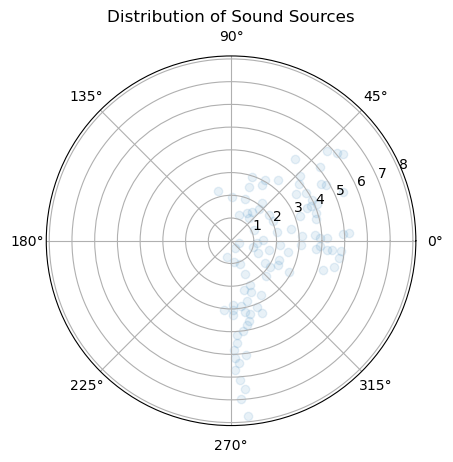

In [11]:
selected_angles = np.arctan2(ray_directions[:, 1], ray_directions[:, 0])

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.scatter(selected_angles[idx_rays], source_dist, alpha=0.1)
plt.title("Distribution of Sound Sources")
plt.show()

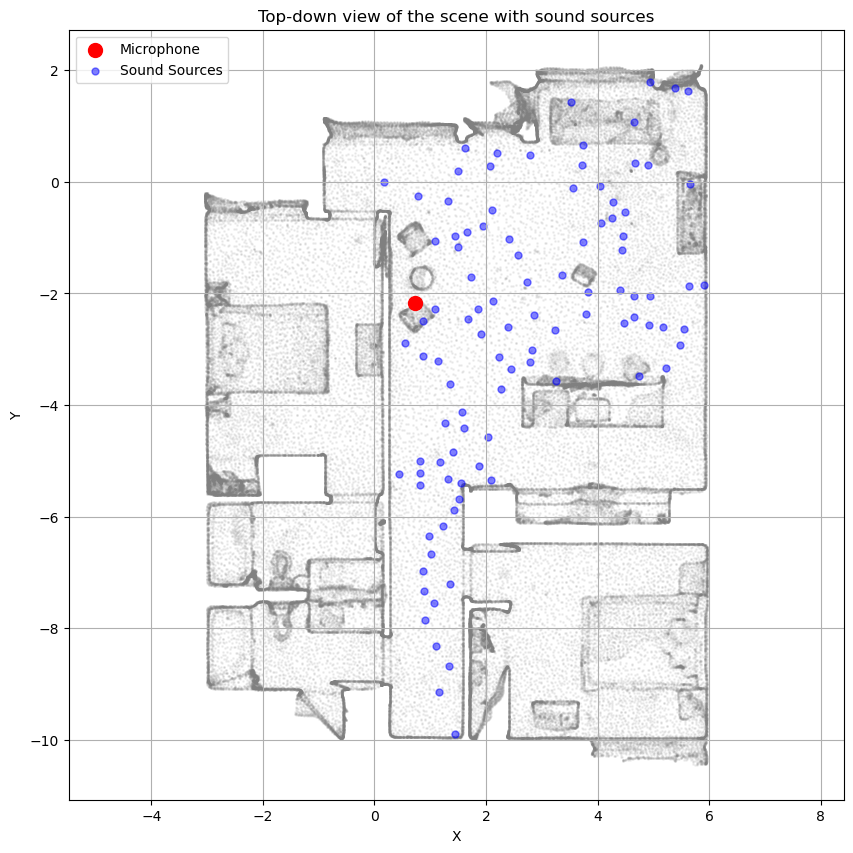

In [12]:
# Plot top-down view of the scene and new sources
plt.figure(figsize=(10, 10))

# Plot mesh vertices
vertices = new_mesh.vertices
plt.scatter(vertices[:, 0], vertices[:, 1], c='gray', alpha=0.1, s=1)

# Plot microphone position
plt.scatter(mic_pos[0], mic_pos[1], c='red', s=100, label='Microphone')

# Plot new sources
new_sources = np.array(source_positions)
plt.scatter(new_sources[:, 0], new_sources[:, 1], c='blue', s=25, alpha=0.5, label='Sound Sources')

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Top-down view of the scene with sound sources')
plt.legend()
plt.axis('equal')
plt.grid(True)
plt.show()

In [ ]:
###### WRITE IRS TO WAVS TO SEE PLOTS 

import os
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt

wav_dir = "RIR_wavs"
png_dir = "RIR_plots"
os.makedirs(wav_dir, exist_ok=True)
os.makedirs(png_dir, exist_ok=True)

listener_index = 0
for source_index, source_position in enumerate(source_positions):
    # Calculate relative position to the microphone
    relative_position = np.array(source_position) - np.array(mic_pos)
    x, y, z = relative_position
    x, y, z = round(x, 3), round(y, 3), round(z, 3)
    
    coord_filename = f"{x}_{y}_{z}"
    
    output_filename = os.path.join(wav_dir, f"{coord_filename}.wav")
    print(f"Source index {source_index} file name is: {coord_filename}.wav")
    
    ir_sample_count = ctx.get_ir_sample_count(listener_index, source_index)
    ir_channel_count = ctx.get_ir_channel_count(listener_index, source_index)
    ir = np.zeros((ir_channel_count, ir_sample_count))
    
    for i in range(ir_channel_count):
        channel = np.array(ctx.get_ir_channel(listener_index, source_index, i))
        ir[i] = channel
    
    sample_rate = int(cfg.sample_rate)
    sf.write(output_filename, ir.T, sample_rate)
    
    print(f"Room Impulse Response saved as {output_filename}")
    print(f"Number of IR channels: {ir_channel_count}")
    print(f"Number of IR samples: {ir_sample_count}")
    print(f"Sample rate: {sample_rate} Hz")
    
    plt.figure(figsize=(15, 10))
    channel_names = ['W (Omnidirectional)', 'Y (Left-Right)', 'Z (Up-Down)', 'X (Front-Back)']
    for i in range(min(4, ir_channel_count)):
        plt.subplot(min(4, ir_channel_count), 1, i+1)
        plt.plot(ir[i])
        plt.title(f"{channel_names[i]} - Source at ({x}, {y}, {z})")
        plt.ylim([-1,1])
        plt.ylabel('Amplitude')
        plt.grid(True)
    
    plt.xlabel('Sample')
    plt.suptitle(f'Room Impulse Response - Ambisonics Channels - Source at ({x}, {y}, {z})', fontsize=16)
    plt.tight_layout()
    plot_filename = os.path.join(png_dir, f"RIR_plot_{coord_filename}.png")
    plt.savefig(plot_filename)
    plt.close()

print("All Room Impulse Responses have been saved and plotted.")

In [13]:
def create_srir_sofa(
    filepath,
    rirs,
    source_pos,
    mic_pos,
    db_name="Default_db",
    room_name="Room_name",
    listener_name="foa",
    sr=24000,
    comment="N/A",
):
    print("Starting create_srir_sofa function")
    
    M = rirs.shape[0]
    R = rirs.shape[1]
    N = rirs.shape[2]
    E = 1
    I = 1
    C = 3

    print(f"Shapes: M={M}, R={R}, N={N}, E={E}, I={I}, C={C}")

    assert rirs.shape == (M, R, N), f"RIRs shape mismatch: expected {(M, R, N)}, got {rirs.shape}"
    assert source_pos.shape == (M, C), f"Source position shape mismatch: expected {(M, C)}, got {source_pos.shape}"

    print(f"Checking if file exists: {filepath}")
    if os.path.exists(filepath):
        print(f"Overwriting {filepath}")
        os.remove(filepath)
    
    print("Creating Dataset")
    rootgrp = Dataset(filepath, "w", format="NETCDF4")

    print("Setting Required Attributes")
    rootgrp.Conventions = "SOFA"
    rootgrp.Version = "2.1"
    rootgrp.SOFAConventions = "SingleRoomSRIR"
    rootgrp.SOFAConventionsVersion = "1.0"
    rootgrp.APIName = "pysofaconventions"
    rootgrp.APIVersion = "0.1.5"
    rootgrp.AuthorContact = "chris.ick@nyu.edu"
    rootgrp.Organization = "Music and Audio Research Lab - NYU"
    rootgrp.License = "Use whatever you want"
    rootgrp.DataType = "FIR"
    rootgrp.DateCreated = time.ctime(time.time())
    rootgrp.DateModified = time.ctime(time.time())
    rootgrp.Title = db_name + " - " + room_name
    rootgrp.RoomType = "shoebox"
    rootgrp.DatabaseName = db_name
    rootgrp.ListenerShortName = listener_name
    rootgrp.RoomShortName = room_name
    rootgrp.Comment = comment

    print("Creating Required Dimensions")
    rootgrp.createDimension("M", M)
    rootgrp.createDimension("N", N)
    rootgrp.createDimension("E", E)
    rootgrp.createDimension("R", R)
    rootgrp.createDimension("I", I)
    rootgrp.createDimension("C", C)

    print("Creating Required Variables")
    print("Creating ListenerPosition")
    listenerPositionVar = rootgrp.createVariable("ListenerPosition", "f8", ("M", "C"))
    listenerPositionVar.Units = "metre"
    listenerPositionVar.Type = "cartesian"
    listenerPositionVar[:] = mic_pos

    print("Creating ListenerUp")
    listenerUpVar = rootgrp.createVariable("ListenerUp", "f8", ("I", "C"))
    listenerUpVar.Units = "metre"
    listenerUpVar.Type = "cartesian"
    listenerUpVar[:] = np.asarray([0, 0, 1])

    print("Creating ListenerView")
    listenerViewVar = rootgrp.createVariable("ListenerView", "f8", ("I", "C"))
    listenerViewVar.Units = "metre"
    listenerViewVar.Type = "cartesian"
    listenerViewVar[:] = np.asarray([1, 0, 0])

    print("Creating EmitterPosition")
    emitterPositionVar = rootgrp.createVariable(
        "EmitterPosition", "f8", ("E", "C", "I")
    )
    emitterPositionVar.Units = "metre"
    emitterPositionVar.Type = "spherical"
    emitterPositionVar[:] = np.zeros((E, C, I))

    print("Creating SourcePosition")
    sourcePositionVar = rootgrp.createVariable("SourcePosition", "f8", ("M", "C"))
    sourcePositionVar.Units = "metre"
    sourcePositionVar.Type = "cartesian"
    sourcePositionVar[:] = source_pos

    print("Creating SourceUp")
    sourceUpVar = rootgrp.createVariable("SourceUp", "f8", ("I", "C"))
    sourceUpVar.Units = "metre"
    sourceUpVar.Type = "cartesian"
    sourceUpVar[:] = np.asarray([0, 0, 1])

    print("Creating SourceView")
    sourceViewVar = rootgrp.createVariable("SourceView", "f8", ("I", "C"))
    sourceViewVar.Units = "metre"
    sourceViewVar.Type = "cartesian"
    sourceViewVar[:] = np.asarray([1, 0, 0])

    print("Creating ReceiverPosition")
    receiverPositionVar = rootgrp.createVariable(
        "ReceiverPosition", "f8", ("R", "C", "I")
    )
    receiverPositionVar.Units = "metre"
    receiverPositionVar.Type = "cartesian"
    receiverPositionVar[:] = np.zeros((R, C, I))

    print("Creating Data.SamplingRate")
    samplingRateVar = rootgrp.createVariable("Data.SamplingRate", "f8", ("I"))
    samplingRateVar.Units = "hertz"
    samplingRateVar[:] = sr

    print("Creating Data.Delay")
    delayVar = rootgrp.createVariable("Data.Delay", "f8", ("I", "R"))
    delay = np.zeros((I, R))
    delayVar[:, :] = delay

    print("Creating Data.IR")
    dataIRVar = rootgrp.createVariable("Data.IR", "f8", ("M", "R", "N"))
    dataIRVar.ChannelOrdering = "acn"  # standard ambi ordering
    dataIRVar.Normalization = "sn3d"
    dataIRVar[:] = rirs

    print("Closing file")
    rootgrp.close()  # Note: Added parentheses here
    print(f"SOFA file saved to {filepath}")
    print("create_srir_sofa function completed")

In [14]:
from pathlib import Path
import numpy as np
import os
from netCDF4 import Dataset
import time

GIBSON_DB_NAME = "GIBSON" 
dest_path_sofa = Path("output/")  
audio_fmts = ["foa"]
sr = int(cfg.sample_rate) 

def prepare_soundspaces(ctx, source_positions, mic_pos, listener_index, dest_path_sofa, audio_fmts=["foa"]):
    print(f"Total number of source positions: {len(source_positions)}")

    for fmt in audio_fmts:
        IRs = []
        coords = []
        max_length = 0
        for source_index, source_position in enumerate(source_positions):
            relative_position = np.array(source_position) - np.array(mic_pos)
            x, y, z = relative_position
            x, y, z = round(x, 3), round(y, 3), round(z, 3)
            coords.append([x, y, z])
            ir_sample_count = ctx.get_ir_sample_count(listener_index, source_index)
            ir_channel_count = ctx.get_ir_channel_count(listener_index, source_index)
            
            ir = np.zeros((ir_channel_count, ir_sample_count))
            for i in range(ir_channel_count):
                channel = np.array(ctx.get_ir_channel(listener_index, source_index, i))
                ir[i] = channel
            if ir.shape[1] > max_length:
                max_length = ir.shape[1]
            IRs.append(ir)
            
            print(f"IR {source_index}:")
            print(f"  Position: ({x}, {y}, {z})")
            print(f"  Channels: {ir_channel_count}")
            print(f"  Samples: {ir_sample_count}")
            print(f"  Shape: {ir.shape}")
            print()

        # Pad IRs to max_length
        padded_IRs = []
        for ir in IRs:
            if ir.shape[1] < max_length:
                padded = np.zeros((ir.shape[0], max_length))
                padded[:, :ir.shape[1]] = ir
                padded_IRs.append(padded)
            else:
                padded_IRs.append(ir[:, :max_length])
        
        filepath = dest_path_sofa / f"soundspaces_{fmt}.sofa"
        rirs = np.array(padded_IRs)
        source_pos = np.array(coords) 
        mic_pos = np.array([[0, 0, 0]])
        
        create_srir_sofa(
            filepath,
            rirs,
            source_pos,
            mic_pos,
            db_name=GIBSON_DB_NAME,
            room_name="soundspaces_shoebox",
            listener_name="foa",
            sr=sr,
        )

    print("SOFA file has been created.")
    print(f"Final IR array shape: {rirs.shape}")


prepare_soundspaces(ctx, source_positions, mic_pos, listener_index=0, dest_path_sofa=dest_path_sofa)

Total number of source positions: 100
IR 0:
  Position: (3.112, 0.196, -0.224)
  Channels: 4
  Samples: 69493
  Shape: (4, 69493)

IR 1:
  Position: (2.53, -1.391, -0.949)
  Channels: 4
  Samples: 60391
  Shape: (4, 60391)

IR 2:
  Position: (0.162, -5.152, 0.038)
  Channels: 4
  Samples: 70067
  Shape: (4, 70067)

IR 3:
  Position: (3.559, 1.814, 0.085)
  Channels: 4
  Samples: 69408
  Shape: (4, 69408)

IR 4:
  Position: (3.949, 2.506, 0.41)
  Channels: 4
  Samples: 69429
  Shape: (4, 69429)

IR 5:
  Position: (2.063, -1.051, -0.244)
  Channels: 4
  Samples: 69924
  Shape: (4, 69924)

IR 6:
  Position: (3.024, 2.84, 0.466)
  Channels: 4
  Samples: 69307
  Shape: (4, 69307)

IR 7:
  Position: (-0.182, -0.708, 1.092)
  Channels: 4
  Samples: 69618
  Shape: (4, 69618)

IR 8:
  Position: (2.11, -0.835, 0.512)
  Channels: 4
  Samples: 69533
  Shape: (4, 69533)

IR 9:
  Position: (3.928, 0.123, -0.263)
  Channels: 4
  Samples: 69572
  Shape: (4, 69572)

IR 10:
  Position: (4.827, -0.456, -